In [7]:
# import utilities
from utils import *
from behaviors import *
from packages.photometry_functions import get_zdFF
from peristimulus import *
from neuro_series import *
from neurobehavior_base import *
import numbers
import logging
import itertools
logging.basicConfig(level=logging.INFO)
#sns.set_context("talk")
%matplotlib inline

# Restaurant Row Example

## General Framework
* trial-based analysis
    * data cleaning
        * regular dropping data of inconsistent behavioral trial
        * neural data: pre/post AUC, PC3
            * visualization of variance explained, colored by animal -> could cross-validate with held out trials, pick number of PC chosen
        * flavor preference: calculate from meta data: only use `hazard=0`
            * perform same analysis for sessions with neural data and see how stable is the flavor preference.
        * action value analysis: check if stable across sessions? -> fit action value for each session and then check consistency


### TODO:
1. go through each plot and label quality check
2. pick valid event time windows

### Neural signal quality check

In [8]:
data_root = r'D:\U19\data\RR\ARJ_raw'
cache_folder = r'D:\U19\data\RR\caching'
rse = RR_Expr(data_root)
# rse.neural_sig_check('RRM', fp_recorded=1) # RECORDED=1

Changing plot_path as D:U19\data\RR\plots


In [20]:
# animal='RRM031'
# session='Day149'
# animal, session = 'RRM030', 'Day139'
animal, session = 'RRM033', 'Day143'
# 'RRM033', 'Day143' converging session
# 'RRM030', 'Day139' diverging session
bmat, rr_series = rse.load_animal_session(animal, session)
plot_path = rse.plot_path
# rr_series.neural_df
rr_series.cache_folder = None

#### Visualization of Preprocess: Better performance in comparison to jove method

In [21]:

def FP_quality_visualization(
    raw_reference,
    raw_signal,
    ftime,
    initial_time=300,
    drop_frame=200,
    time_unit="s",
    sig_channel="470nm",
    control_channel="415nm",
    method="lossless",
    roi="470nm",
    roc_method="QDA",
    tag="",
    fr=20,
    viz=True,
):
    # Assuming signal has already been properly dropped
    ## TODO: check edge case when there is linalg error leading to auc-roc method error

    ch, control_ch = sig_channel, control_channel
    roi_string = roi.replace(ch, "")
    if roi_string:
        roi_string = roi_string + "_"
    else:
        roi_string = "ROI_"
    roi_title = roi_string.replace("_", " ")

    # result_df, pgrid = jove_find_best_param(raw_reference, raw_signal, smooth_win=int(fr), use_raw=False, remove=0)
    # z_reference, z_signal, z_reference_fitted = jove_fit_reference(raw_reference, raw_signal, smooth_win=int(fr),
    #                                                                use_raw=False, remove=0, **pgrid)
    if method == "jove":
        z_reference, z_signal, z_reference_fitted = jove_fit_reference(
            raw_reference, raw_signal, use_raw=False, remove=0
        )
    else:
        reference_fitted = fit_reference(
            ftime,
            raw_reference,
            raw_signal,
            fr,
            1 / (30 * fr),
            drop=drop_frame,
            window_size=11,
            r_squared_threshold=0.7,
            pos_coef=False,
            detrend_last=False,
            smoothing_method="tma",
            baseline_method="lpf",
            fit_method="l",
        )
        z_reference = raw_reference
        z_signal = raw_signal
        z_reference_fitted = reference_fitted
    sig_dict = {
        "reference": z_reference,
        "signal": z_signal,
        "fitted_ref": z_reference_fitted,
    }
    # selector = z_signal >= (np.median(z_signal) + np.std(z_signal))
    selector = np.abs(z_signal - np.median(z_signal)) >= np.std(z_signal)
    auc_score = auc_roc_2dist(
        z_reference_fitted[selector], z_signal[selector], roc_method
    )
    # if not viz:
    #     return None, auc_score, sig_dict
    # selector = np.full(len(z_signal), 1, dtype=bool)
    print(f"Selected {100 * np.sum(selector) / len(selector):.4f}% data")
    # Plot two channels against each other
    fig = None
    if viz:
        fig = plt.figure(figsize=(20, 9))
        gs = GridSpec(nrows=4, ncols=3)
        ax0 = fig.add_subplot(gs[0, :])
        min_time = np.min(ftime)
        segment_sel = ftime <= (min_time + initial_time)

        segment_time = ftime[segment_sel][drop_frame:] - min_time
        normalize = lambda xs: (xs - np.mean(xs)) / np.std(xs)
        sig_segment = normalize(raw_signal[segment_sel][drop_frame:])
        ref_segment = normalize(raw_reference[segment_sel][drop_frame:])
        ax0.plot(segment_time, sig_segment, label=ch)
        ax0.plot(segment_time, ref_segment, label=control_ch)
        ax0.set_ylabel(f"{roi_string}Z(RawF)")
        ax0.set_title(
            f"{roi_title.title()}Raw {ch} Contrasted With Control (First {initial_time / 60:.2f} Min)"
        )
        ax0.legend()

        ax01 = fig.add_subplot(gs[1, :])
        max_time = np.max(ftime)
        segment_sel1 = ftime >= (max_time - initial_time)
        segment_time1 = ftime[segment_sel1] - min_time
        sig_segment1 = normalize(raw_signal[segment_sel1])
        ref_segment1 = normalize(raw_reference[segment_sel1])
        ax01.plot(segment_time1, sig_segment1, label=ch)
        ax01.plot(segment_time1, ref_segment1, label=control_ch)
        ax01.set_ylabel(f"{roi_string}Z(RawF)")
        ax01.set_title(
            f"{roi_title.title()}Raw {ch} Contrasted With Control (Last {initial_time / 60:.2f} Min)"
        )
        ax01.legend()

        ax1 = fig.add_subplot(gs[2, :])
        ax1.plot(segment_time, z_signal[segment_sel][drop_frame:], label=f"Z({ch})")
        # ax1.plot(segment_time, z_reference[segment_sel][drop_frame:], label=control_ch)
        ax1.plot(
            segment_time,
            z_reference_fitted[segment_sel],
            label="~" + control_ch,
        )
        ax1.set_ylabel(f"{roi_string}Z(F)")
        ax1.set_xlabel(f"Rel. Time ({time_unit})")
        ax1.set_title(
            f"{roi_title.title()}Z {ch} Contrasted With Control (First {initial_time / 60:.2f} Min)"
        )
        ax1.legend()

        # Plot scatter plot visualization of two channels
        ax2 = fig.add_subplot(gs[3, 0])
        ax2.plot(z_reference[selector], z_signal[selector], "b.")
        ax2.plot(z_reference, z_reference_fitted, "r--", linewidth=1.5)
        ax2.set_xlabel(f"{control_ch} values")
        ax2.set_ylabel(f"{ch} values")
        ax3 = fig.add_subplot(gs[3, 1])

        sns.histplot(
            z_reference_fitted[selector], label=control_ch, kde=False, ax=ax3, color="b"
        )
        # sns.histplot(z_reference_fitted[selector], label=control_ch, kde=True, ax=ax1, color='b')
        sns.histplot(z_signal[selector], label=ch, kde=False, ax=ax3, color="r")
        ax3.legend()
        sns.despine()

        ax4 = fig.add_subplot(gs[3, 2])
        sns.histplot(
            z_signal[selector] - z_reference_fitted[selector], kde=True, ax=ax4
        )
        ax4.legend(["diff(470, ~415)"])
        sns.despine()
        if tag:
            tag = tag + " "
        plt.subplots_adjust(hspace=0.4)
        fig.suptitle(
            f"{tag}{ch} {roi_title}auc-roc score ({roc_method}): {auc_score:.4f}",
            fontsize="xx-large",
        )

    return fig, auc_score, sig_dict

In [12]:
import plotly.express as px
from nb_viz import PlotlyFig
pfig = PlotlyFig(rows=4, cols=1, shared_xaxes=True)
dff_df = rr_series.calculate_dff(method='lossless')
roi = 'left'
drop=200
pfig.plot(rr_series.neural_df['time'].values[drop:], rr_series.neural_df['left_410nm'].values[drop:], name='reference', mode='lines', row=1)
pfig.plot(rr_series.neural_df['time'].values[drop:], rr_series.neural_df['left_470nm'].values[drop:], name='signal', mode='lines', row=2)
plotdf = dff_df.loc[dff_df['roi'] == f'{roi}_470nm']
pfig.plot(plotdf['time'], plotdf['ZdFF'], name='dFF_lossless', mode='lines', row=3)

dff_df2 = rr_series.calculate_dff(method='ZdF_jove')
plotdf2 = dff_df2.loc[dff_df2['roi'] == f'{roi}_470nm']
pfig.plot(plotdf2['time'], plotdf2['ZdFF'], name='dFF_jove', mode='lines', color='red', row=4)
pfig.fig.add_vline(x=1543, row='all', line_width=1, line_color="green")
pfig.show()

[[0.44987556]]
[[-0.00286778]]


In [22]:
def FP_quality_visualization(
    raw_reference,
    raw_signal,
    ftime,
    initial_time=300,
    drop_frame=200,
    time_unit="s",
    sig_channel="470nm",
    control_channel="415nm",
    method="lossless",
    roi="470nm",
    roc_method="QDA",
    tag="",
    fr=20,
    viz=True,
):
    # Assuming signal has already been properly dropped
    ## TODO: check edge case when there is linalg error leading to auc-roc method error

    ch, control_ch = sig_channel, control_channel
    roi_string = roi.replace(ch, "")
    if roi_string:
        roi_string = roi_string + "_"
    else:
        roi_string = "ROI_"
    roi_title = roi_string.replace("_", " ")

    # result_df, pgrid = jove_find_best_param(raw_reference, raw_signal, smooth_win=int(fr), use_raw=False, remove=0)
    # z_reference, z_signal, z_reference_fitted = jove_fit_reference(raw_reference, raw_signal, smooth_win=int(fr),
    #                                                                use_raw=False, remove=0, **pgrid)
    if method == "jove":
        z_reference, z_signal, z_reference_fitted = jove_fit_reference(
            raw_reference, raw_signal, use_raw=False, remove=drop_frame
        )
    else:
        reference_fitted = fit_reference(
            ftime,
            raw_reference,
            raw_signal,
            fr,
            1 / (30 * fr),
            drop=drop_frame,
            window_size=11,
            r_squared_threshold=0.7,
            pos_coef=False,
            detrend_last=False,
            smoothing_method="tma",
            baseline_method="lpf",
            fit_method="l",
        )
        z_reference = raw_reference[drop_frame:]
        z_signal = raw_signal[drop_frame:]
        z_reference_fitted = reference_fitted
    sig_dict = {
        "reference": z_reference,
        "signal": z_signal,
        "fitted_ref": z_reference_fitted,
    }
    # selector = z_signal >= (np.median(z_signal) + np.std(z_signal))
    selector = np.abs(z_signal - np.median(z_signal)) >= np.std(z_signal)
    auc_score = auc_roc_2dist(
        z_reference_fitted[selector], z_signal[selector], roc_method
    )
    # if not viz:
    #     return None, auc_score, sig_dict
    # selector = np.full(len(z_signal), 1, dtype=bool)
    print(f"Selected {100 * np.sum(selector) / len(selector):.4f}% data")
    # Plot two channels against each other
    fig = None
    if viz:
        fig = plt.figure(figsize=(20, 9))
        gs = GridSpec(nrows=4, ncols=3)
        ax0 = fig.add_subplot(gs[0, :])
        min_time = np.min(ftime)
        segment_sel = ftime[drop_frame:] <= (min_time + initial_time)

        segment_time = ftime[drop_frame:][segment_sel] - min_time
        normalize = lambda xs: (xs - np.mean(xs)) / np.std(xs)
        sig_segment = normalize(raw_signal[drop_frame:][segment_sel])
        ref_segment = normalize(raw_reference[drop_frame:][segment_sel])
        ax0.plot(segment_time, sig_segment, label=ch)
        ax0.plot(segment_time, ref_segment, label=control_ch)
        ax0.set_ylabel(f"{roi_string}Z(RawF)")
        ax0.set_title(
            f"{roi_title.title()}Raw {ch} Contrasted With Control (First {initial_time / 60:.2f} Min)"
        )
        ax0.legend()

        ax01 = fig.add_subplot(gs[1, :])
        max_time = np.max(ftime)
        segment_sel1 = ftime >= (max_time - initial_time)
        segment_time1 = ftime[segment_sel1] - min_time
        sig_segment1 = normalize(raw_signal[segment_sel1])
        ref_segment1 = normalize(raw_reference[segment_sel1])
        ax01.plot(segment_time1, sig_segment1, label=ch)
        ax01.plot(segment_time1, ref_segment1, label=control_ch)
        ax01.set_ylabel(f"{roi_string}Z(RawF)")
        ax01.set_title(
            f"{roi_title.title()}Raw {ch} Contrasted With Control (Last {initial_time / 60:.2f} Min)"
        )
        ax01.legend()

        ax1 = fig.add_subplot(gs[2, :])
        ax1.plot(segment_time, z_signal[segment_sel], label=f"Z({ch})")
        # ax1.plot(segment_time, z_reference[segment_sel][drop_frame:], label=control_ch)
        ax1.plot(
            segment_time,
            z_reference_fitted[segment_sel],
            label="~" + control_ch,
        )
        ax1.set_ylabel(f"{roi_string}Z(F)")
        ax1.set_xlabel(f"Rel. Time ({time_unit})")
        ax1.set_title(
            f"{roi_title.title()}Z {ch} Contrasted With Control (First {initial_time / 60:.2f} Min)"
        )
        ax1.legend()

        # Plot scatter plot visualization of two channels
        ax2 = fig.add_subplot(gs[3, 0])
        ax2.plot(z_reference[selector], z_signal[selector], "b.")
        ax2.plot(z_reference, z_reference_fitted, "r--", linewidth=1.5)
        ax2.set_xlabel(f"{control_ch} values")
        ax2.set_ylabel(f"{ch} values")
        ax3 = fig.add_subplot(gs[3, 1])

        sns.histplot(
            z_reference_fitted[selector], label=control_ch, kde=False, ax=ax3, color="b"
        )
        # sns.histplot(z_reference_fitted[selector], label=control_ch, kde=True, ax=ax1, color='b')
        sns.histplot(z_signal[selector], label=ch, kde=False, ax=ax3, color="r")
        ax3.legend()
        sns.despine()

        ax4 = fig.add_subplot(gs[3, 2])
        sns.histplot(
            z_signal[selector] - z_reference_fitted[selector], kde=True, ax=ax4
        )
        ax4.legend(["diff(470, ~415)"])
        sns.despine()
        if tag:
            tag = tag + " "
        plt.subplots_adjust(hspace=0.4)
        fig.suptitle(
            f"{tag}{ch} {roi_title}auc-roc score ({roc_method}): {auc_score:.4f}",
            fontsize="xx-large",
        )

    return fig, auc_score, sig_dict

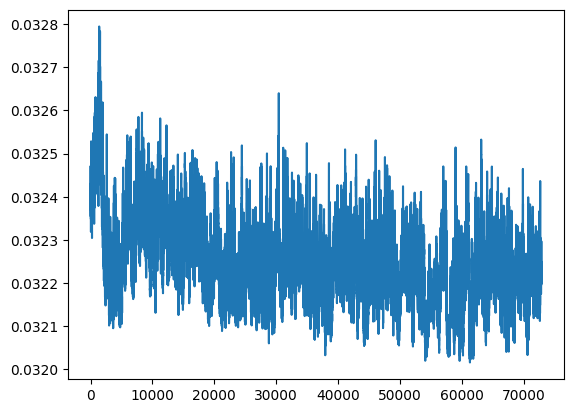

In [19]:
plt.plot(raw_signal)

[[-0.00286778]]


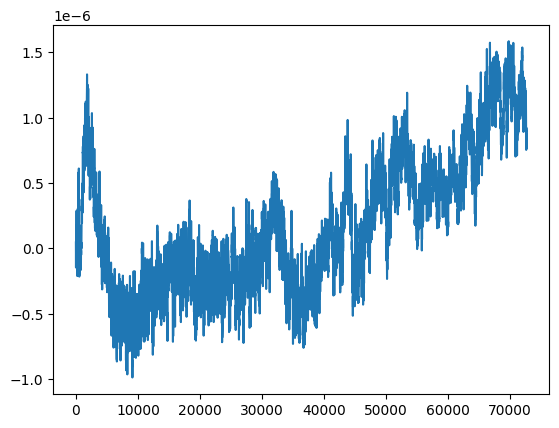

In [18]:
ftime = rr_series.neural_df['time']
raw_reference = rr_series.neural_df['left_410nm']
raw_signal = rr_series.neural_df['left_470nm']
fr=20
drop_frame=200
reference_fitted = fit_reference(
    ftime,
    raw_reference,
    raw_signal,
    fr,
    1 / (30 * fr),
    drop=drop_frame,
    window_size=11,
    r_squared_threshold=0.7,
    pos_coef=False,
    detrend_last=False,
    smoothing_method="tma",
    baseline_method="lpf",
    fit_method="l",
)
plt.plot(reference_fitted)

Selected 24.8467% data


(<Figure size 2000x900 with 6 Axes>,
 1.0,
 {'reference': array([10.30290204, 10.18586809, 10.06597725, ...,  0.95256613,
          0.9634603 ,  0.96912603]),
  'signal': array([ 7.48393908,  7.28983591,  7.15776172, ..., -0.17358368,
         -0.17190221, -0.20464424]),
  'fitted_ref': array([0.55301261, 0.54884333, 0.54457228, ..., 0.21991127, 0.22029937,
         0.22050121])})

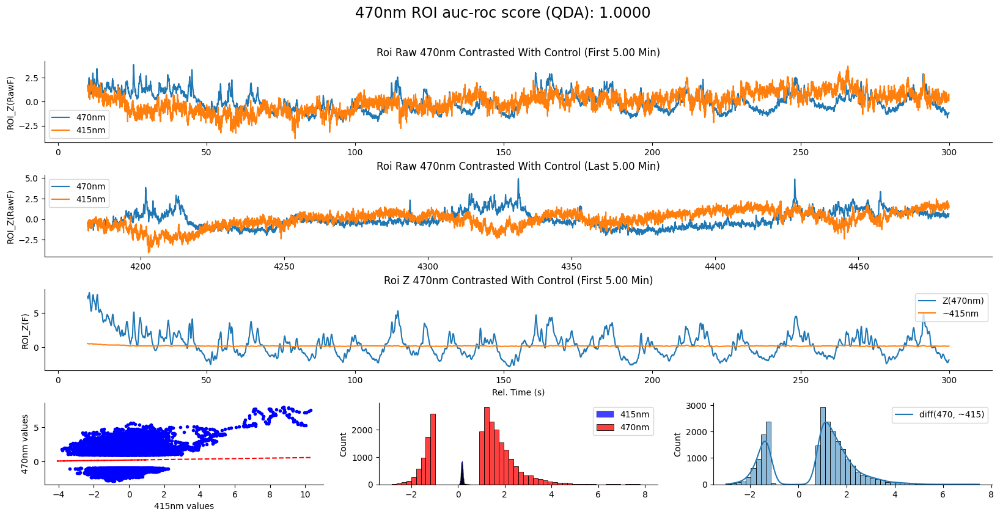

In [23]:
FP_quality_visualization(rr_series.neural_df['left_410nm'].values, rr_series.neural_df['left_470nm'].values, rr_series.neural_df['time'].values, method='jove')

### Data EDA

In [11]:
nb_df_31 = rse.align_lagged_view('RRM', ['T_Entry', 'tone_onset'], animal='RRM031')

100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


* Go over raw data quality
* fill load data hazard spread sheet

In [13]:
def animal_tone_prob_view(nb_df, animal_arg):
    event = 'tone_onset'
    gradient=False
    rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df)
    select_time = [c for c in rse.nbm.nb_cols[f'{event}_neur'] if (float(c.split('|')[1]) <= 1) & (float(c.split('|')[1]) >=-1)]
    tone_base_time = [c for c in rse.nbm.nb_cols['tone_onset_neur'] if (float(c.split('|')[1]) <= 0) & (float(c.split('|')[1]) >=-0.1)]
    #'decision_time', 'hall_time', 'trial_type'
    nb_df_lagged = nb_df[['animal', 'session', 'trial', 'cell_type', 'tone_prob', 'roi', 'accept', 'quit', 'restaurant'] + select_time +
                     list(np.setdiff1d(tone_base_time, select_time))].reset_index(drop=True)
    nb_df_lagged[select_time] = nb_df_lagged[select_time].values - np.mean(nb_df_lagged[tone_base_time].values, axis=1, keepdims=True)
    if gradient:
        targ_cols = rse.nbm.nb_cols[event+'_neur']
        nb_df_lagged[targ_cols] = np.gradient(nb_df[targ_cols].values, axis=1)
    rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df_lagged)
    nb_df_lagged = rse.nbm.lag_wide_df(nb_df_lagged, {f'{event}_neur': {'long': True}})
    nb_df_lagged['tone_prob'] = nb_df_lagged['tone_prob'].astype(int)
    # clean accept
    plot_tag = "all_trials"

    plot_nb_df = nb_df_lagged
    plot_nb_df['tone_prob'] = plot_nb_df['tone_prob'].astype(int)
    plot_nb_df['roi'] = plot_nb_df['roi'].str.replace("_470nm", "")

    tone_palette = [sns.color_palette('Spectral_r', 101)[0],
                    sns.color_palette('Spectral_r', 101)[20],
                    sns.color_palette('Spectral_r', 101)[80],
                    sns.color_palette('Spectral_r', 101)[100]]

    # neural response plotting
    x, y = f'{event}_neur_time', f'{event}_neur_ZdFF'
    row, col, hue, style =  'animal', 'roi', 'tone_prob', None
    other_cols = []
    params = [x, y, row, col, hue, style]
    kwargs = {'palette': tone_palette,
            'col_order': ['left', 'right'],
            'hue_order': [0, 20, 80, 100],
            'aspect': 1.5}

    sub_cols = [p for p in params if (p is not None)] + other_cols
    # processing plotting data
    plot_nb_df = rse.meta_safe_drop(plot_nb_df[sub_cols]).reset_index(drop=True)
    # for col in col_orders:
    #     plot_nb_df = nb_df_reorder_column(plot_nb_df, col, col_orders[col])
    sns.set_context('talk')
    sns.set_style('white')
    g1= sns.relplot(x=x, y=y, hue=hue, row=row, col=col, style=style, kind="line", data=plot_nb_df, **kwargs)
    g1.map_dataframe(lambda data, **kwargs: plt.gca().axvline(0, c='gray', ls='--'))
    g1.set_titles(col_template="{col_name}", row_template="{row_name}")
    if gradient:
        g1.set_axis_labels("Time in seconds", "(ZdF)'")
    else:
        g1.set_axis_labels("Time in seconds", y.split('_')[-1][:-1])
    g1.fig.suptitle(f'{animal_arg} {event} {plot_tag}', y=1.1)
    return g1


def animal_entry_view(nb_df, animal_arg):
    event = 'T_Entry'
    gradient=False
    rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df)
    select_time = [c for c in rse.nbm.nb_cols[f'{event}_neur'] if (float(c.split('|')[1]) <= 1) & (float(c.split('|')[1]) >=-1)]
    tone_base_time = [c for c in rse.nbm.nb_cols['tone_onset_neur'] if (float(c.split('|')[1]) <= 0) & (float(c.split('|')[1]) >=-0.1)]
    #'decision_time', 'hall_time', 'trial_type'
    nb_df_lagged = nb_df[['animal', 'session', 'trial', 'cell_type', 'tone_prob', 'roi', 'accept', 'quit', 'restaurant'] + select_time +
                     list(np.setdiff1d(tone_base_time, select_time))].reset_index(drop=True)
    nb_df_lagged[select_time] = nb_df_lagged[select_time].values - np.mean(nb_df_lagged[tone_base_time].values, axis=1, keepdims=True)
    if gradient:
        targ_cols = rse.nbm.nb_cols[event+'_neur']
        nb_df_lagged[targ_cols] = np.gradient(nb_df[targ_cols].values, axis=1)
    rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df_lagged)
    nb_df_lagged = rse.nbm.lag_wide_df(nb_df_lagged, {f'{event}_neur': {'long': True}})
    nb_df_lagged['tone_prob'] = nb_df_lagged['tone_prob'].astype(int)
    # clean accept
    plot_tag = "all_trials"

    plot_nb_df = nb_df_lagged
    plot_nb_df['tone_prob'] = plot_nb_df['tone_prob'].astype(int)
    plot_nb_df['roi'] = plot_nb_df['roi'].str.replace("_470nm", "")

    tone_palette = [sns.color_palette('Spectral_r', 101)[0],
                    sns.color_palette('Spectral_r', 101)[20],
                    sns.color_palette('Spectral_r', 101)[80],
                    sns.color_palette('Spectral_r', 101)[100]]

    # neural response plotting
    x, y = f'{event}_neur_time', f'{event}_neur_ZdFF'
    row, col, hue, style =  'animal', 'roi', None, 'accept'
    other_cols = []
    params = [x, y, row, col, hue, style]
    kwargs = {
            'col_order': ['left', 'right'],
            'style_order': [1, 0],
            'aspect': 1.5}

    sub_cols = [p for p in params if (p is not None)] + other_cols
    # processing plotting data
    plot_nb_df = rse.meta_safe_drop(plot_nb_df[sub_cols]).reset_index(drop=True)
    # for col in col_orders:
    #     plot_nb_df = nb_df_reorder_column(plot_nb_df, col, col_orders[col])
    sns.set_context('talk')
    sns.set_style('white')
    g1= sns.relplot(x=x, y=y, hue=hue, row=row, col=col, style=style, kind="line", data=plot_nb_df, **kwargs)
    g1.map_dataframe(lambda data, **kwargs: plt.gca().axvline(0, c='gray', ls='--'))
    g1.set_titles(col_template="{col_name}", row_template="{row_name}")
    if gradient:
        g1.set_axis_labels("Time in seconds", "(ZdF)'")
    else:
        g1.set_axis_labels("Time in seconds", y.split('_')[-1][:-1])
    g1.fig.suptitle(f'{animal_arg} {event} {plot_tag}', y=1.1)
    return g1


def animal_entry_tone_cond_view(nb_df, animal_arg):
    event = 'T_Entry'
    gradient=False
    rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df)
    select_time = [c for c in rse.nbm.nb_cols[f'{event}_neur'] if (float(c.split('|')[1]) <= 1) & (float(c.split('|')[1]) >=-1)]
    tone_base_time = [c for c in rse.nbm.nb_cols['tone_onset_neur'] if (float(c.split('|')[1]) <= 0) & (float(c.split('|')[1]) >=-0.1)]
    #'decision_time', 'hall_time', 'trial_type'
    nb_df_lagged = nb_df[['animal', 'session', 'trial', 'cell_type', 'tone_prob', 'roi', 'accept', 'quit', 'restaurant'] + select_time +
                     list(np.setdiff1d(tone_base_time, select_time))].reset_index(drop=True)
    print(tone_base_time, select_time[:3])
    nb_df_lagged[select_time] = nb_df_lagged[select_time].values - np.mean(nb_df_lagged[tone_base_time].values, axis=1, keepdims=True)
    if gradient:
        targ_cols = rse.nbm.nb_cols[event+'_neur']
        nb_df_lagged[targ_cols] = np.gradient(nb_df[targ_cols].values, axis=1)
    rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df_lagged)
    nb_df_lagged = rse.nbm.lag_wide_df(nb_df_lagged, {f'{event}_neur': {'long': True}})
    nb_df_lagged['tone_prob'] = nb_df_lagged['tone_prob'].astype(int)
    # clean accept
    plot_tag = "all_trials"

    plot_nb_df = nb_df_lagged
    plot_nb_df['tone_prob'] = plot_nb_df['tone_prob'].astype(int)
    plot_nb_df['roi'] = plot_nb_df['roi'].str.replace("_470nm", "")

    tone_palette = [sns.color_palette('Spectral_r', 101)[0],
                    sns.color_palette('Spectral_r', 101)[20],
                    sns.color_palette('Spectral_r', 101)[80],
                    sns.color_palette('Spectral_r', 101)[100]]

    # neural response plotting
    x, y = f'{event}_neur_time', f'{event}_neur_ZdFF'
    row, col, hue, style =  'tone_prob', 'roi', None, 'accept'
    other_cols = []
    params = [x, y, row, col, hue, style]
    kwargs = {'row_order': [100, 80, 20, 0],
            'col_order': ['left', 'right'],
            'style_order': [1, 0],
            'aspect': 1.5}

    sub_cols = [p for p in params if (p is not None)] + other_cols
    # processing plotting data
    plot_nb_df = rse.meta_safe_drop(plot_nb_df[sub_cols]).reset_index(drop=True)
    # for col in col_orders:
    #     plot_nb_df = nb_df_reorder_column(plot_nb_df, col, col_orders[col])
    sns.set_context('talk')
    sns.set_style('white')
    g1= sns.relplot(x=x, y=y, hue=hue, row=row, col=col, style=style, kind="line", data=plot_nb_df, **kwargs)
    g1.map_dataframe(lambda data, **kwargs: plt.gca().axvline(0, c='gray', ls='--'))
    g1.set_titles(col_template="{col_name}", row_template="{row_name}")
    if gradient:
        g1.set_axis_labels("Time in seconds", "(ZdF)'")
    else:
        g1.set_axis_labels("Time in seconds", y.split('_')[-1][:-1])
    g1.fig.suptitle(f'{animal_arg} {event} {plot_tag}', y=1.1)
    return g1


from nb_viz import trial_av_vline_timedots, df_wide_heatmap

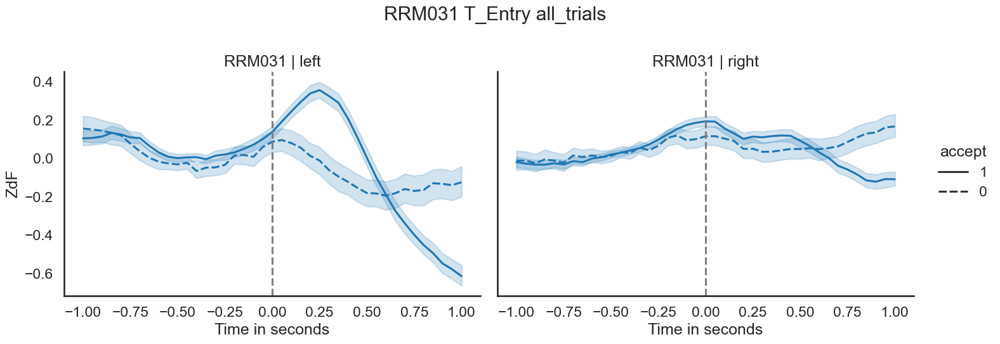

In [14]:
animal_entry_view(nb_df_31, 'RRM031')

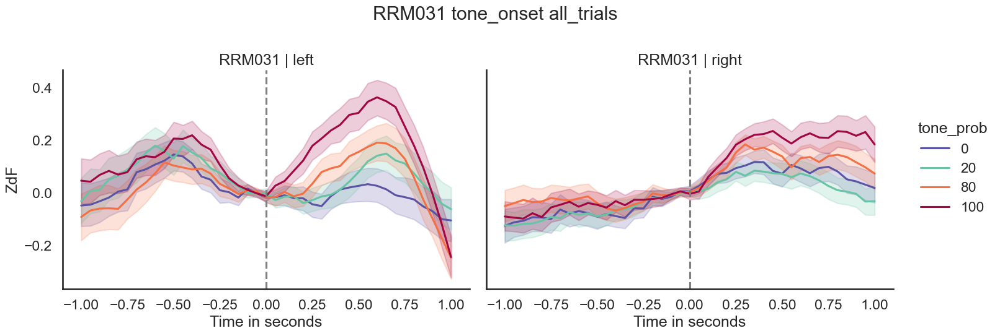

In [15]:
animal_tone_prob_view(nb_df_31, 'RRM031')

### All sessions
After preprocessing, we can filter out the signals session by session here.

In [ ]:
from utils_bsd import DATA_ROOT, CACHE_FOLDER
data_root = '/content/drive/MyDrive/WilbrechtLab/U19_project/analysis/restaurant_row/ARJ_raw'
cache_folder = '/content/drive/MyDrive/WilbrechtLab/U19_project/analysis/restaurant_row/caching'
rse = RR_Expr(data_root)

print(np.max(rse.nbm.event_time_windows['outcome']))

# RRM029, Day136 missing
# RRM032, Day147 missing
# RRM030, Day 134,143,146,159 missing
# RRM027 needs to cut first 20 min
# Currently only filter out
# 3 for bilaterial, 1 for right hemi only, 2 for left only
# RRM026: right hemi: [151, 160, 167, 172, ] # 172 kinda
sessions = {'RRM026': [{151: 2}, {160: 2}, {167: 2}, {172: 2}],
            'RRM027': [{160: 2}, {170: 3}, {175: 3}],
            'RRM028': [],
            'RRM029': [],
            'RRM030': [],
            'RRM031': [],
            'RRM031': [],
            'RRM032': [],
            'RRM033': [],
            'RRM035': [],
            'RRM036': []}

sessions = {'BSD011': ['p151', 'p154, ''p155', 'p156', 'p157', 'p184'],
            'BSD013': ['p151', 'p152', 'p153', 'p157', 'p158', 'p184'],
            'BSD015': ['p104', 'p105', 'p107', 'p108', 'p111', 'p117', 'p119'],
            'BSD016': ['p106', 'p107', 'p109', 'p110', 'p112', 'p113', 'p122', 'p124', 'p125'],
            'BSD017': ['p153', 'p154', 'p156', 'p157', 'p159', 'p160', 'p162', 'p163', 'p166'],
            'BSD018': ['p147', 'p148', 'p150', 'p151', 'p153', 'p154',
                        'p157', 'p158', 'p160', 'p161', 'p163', 'p166', 'p167'],
            'BSD019': ['p139', 'p140', 'p142', 'p143', 'p145', 'p146', 'p148', 'p150',
                        'p152', 'p153', 'p155', 'p156', 'p158']}



In [ ]:
animal_list = ['RRM030', 'RRM031', 'RRM032', 'RRM033', 'RRM035', 'RRM036']
animal_list_parquet = oj(cache_folder, f'RR_31-36_nb_df.pq')
if not os.path.exists(animal_list_parquet):
    nb_df = rse.align_lagged_view('RRM', ['T_Entry', 'tone_onset', 'exit'], laglist=None, animal=lambda s: s.isin(animal_list))
    nb_df.to_parquet(animal_list_parquet)
else:
    nb_df = rse.align_lagged_view_parquet(animal_list_parquet)

In [ ]:
animal_list = ['RRM030', 'RRM031', 'RRM032', 'RRM033', 'RRM035', 'RRM036']
animal_list_parquet = oj(cache_folder, f'RRFP_longT_v3_30-36_nb_df.pq')
rse.nbm.event_time_windows = {'tone_onset': np.arange(-2, 9.001, 0.05),
                            'T_Entry': np.arange(-2, 9.001, 0.05),
                            'choice': np.arange(-1, 1.001, 0.05),
                            'outcome': np.arange(-9, 2.001, 0.05),
                            'quit': np.arange(-7, 2.001, 0.05),
                            'collection': np.arange(-1, 1.001, 0.05),
                            'trial_end': np.arange(-1, 1.001, 0.05),
                            'exit': np.arange(-1, 1.001, 0.05)}
if not os.path.exists(animal_list_parquet):
    nb_df = rse.align_lagged_view('RRM', ['T_Entry', 'tone_onset', 'exit', 'quit', 'outcome', 'collection'], laglist=None, animal=lambda s: s.isin(animal_list), fp_recorded=True)
    nb_df.to_parquet(animal_list_parquet)
else:
    nb_df = rse.align_lagged_view_parquet(animal_list_parquet)

nb_df['hall_time'] = nb_df['T_Entry'] - nb_df['tone_onset']
nb_df['decision_time'] = nb_df['choice'] - nb_df['tone_onset']
nb_df['decision'] = nb_df['accept'].map({0: 'reject', 1: 'accept'})
nb_df.loc[~nb_df['quit'].isnull(), 'decision'] = 'quit'
nb_df['trial_type'] = nb_df['decision']
nb_df.loc[nb_df['decision'] == 'accept', 'trial_type'] = 'unrewarded'
nb_df.loc[(nb_df['decision'] == 'accept') & (nb_df['reward'] == 1), 'trial_type'] = 'rewarded'

In [ ]:
animal_list = ['RRM030', 'RRM031', 'RRM032', 'RRM033', 'RRM035', 'RRM036']
animal_list_parquet = oj(cache_folder, f'RRFP_longT_30-36_nb_df.pq')
rse.nbm.event_time_windows = {'tone_onset': np.arange(-1, 1.001, 0.05),
                            'T_Entry': np.arange(-2, 9.001, 0.05),
                            'choice': np.arange(-1, 1.001, 0.05),
                            'outcome': np.arange(-1, 1.001, 0.05),
                            'quit': np.arange(-1, 1.001, 0.05),
                            'collection': np.arange(-1, 1.001, 0.05),
                            'trial_end': np.arange(-1, 1.001, 0.05),
                            'exit': np.arange(-1, 1.001, 0.05)}
# rse.nbm.event_time_windows = {'tone_onset': np.arange(-2, 9.001, 0.05),
#                             'T_Entry': np.arange(-2, 9.001, 0.05),
#                             'choice': np.arange(-1, 1.001, 0.05),
#                             'outcome': np.arange(-1, 1.001, 0.05),
#                             'quit': np.arange(-1, 1.001, 0.05),
#                             'collection': np.arange(-1, 1.001, 0.05),
#                             'trial_end': np.arange(-1, 1.001, 0.05),
#                             'exit': np.arange(-1, 1.001, 0.05)}
if not os.path.exists(animal_list_parquet):
    nb_df = rse.align_lagged_view('RRM', ['T_Entry', 'tone_onset', 'exit', 'quit', 'outcome', 'collection'], laglist=None, animal=lambda s: s.isin(animal_list), fp_recorded=True)
    nb_df.to_parquet(animal_list_parquet)
else:
    nb_df = rse.align_lagged_view_parquet(animal_list_parquet)

nb_df['hall_time'] = nb_df['T_Entry'] - nb_df['tone_onset']
nb_df['decision_time'] = nb_df['choice'] - nb_df['tone_onset']
nb_df['decision'] = nb_df['accept'].map({0: 'reject', 1: 'accept'})
nb_df.loc[~nb_df['quit'].isnull(), 'decision'] = 'quit'
nb_df['trial_type'] = nb_df['decision']
nb_df.loc[nb_df['decision'] == 'accept', 'trial_type'] = 'unrewarded'
nb_df.loc[(nb_df['decision'] == 'accept') & (nb_df['reward'] == 1), 'trial_type'] = 'rewarded'

#### Single Session

In [10]:
animal='RRM031'
session='Day149'
bmat, neuro_series = rse.load_animal_session(animal, session)
bdf, dff_df = bmat.todf(), neuro_series.calculate_dff(method='ZdF_jove')
nb_df = rse.nbm.align_B2N_dff_ID(bdf, dff_df, ['T_Entry', 'tone_onset', 'exit', 'quit', 'outcome', 'collection'], form='wide')
# load all data
animal_arg = 'all'
event = 'tone_onset'
rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df)
select_time = [c for c in rse.nbm.nb_cols[f'{event}_neur'] if (float(c.split('|')[1]) <= 1) & (float(c.split('|')[1]) >=-1)]
nb_df_lagged = nb_df[['animal', 'session', 'trial', 'tone_prob', 'roi', 'accept', 'lapIndex', 'restaurant'] + select_time].reset_index(drop=True)
rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df_lagged)
nb_df_lagged = rse.nbm.lag_wide_df(nb_df_lagged, {f'{event}_neur': {'long': True}})
nb_df_lagged['tone_prob'] = nb_df_lagged['tone_prob'].astype(int)

INFO:root:Using jove zdff method for dff calculation by default


Text(0.5, 1.1, 'all tone_onset all_trials')

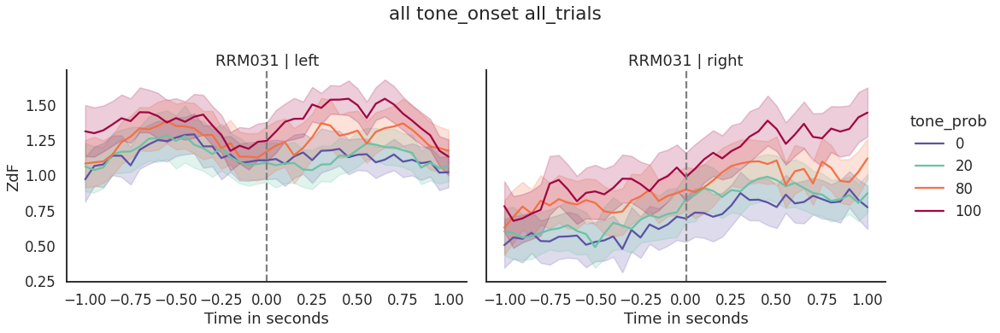

In [ ]:
gradient=False
# clean accept
plot_tag = "all_trials"

plot_nb_df = nb_df_lagged
plot_nb_df['tone_prob'] = plot_nb_df['tone_prob'].astype(int)
plot_nb_df['roi'] = plot_nb_df['roi'].str.replace("_470nm", "")

tone_palette = [sns.color_palette('Spectral_r', 101)[0],
                sns.color_palette('Spectral_r', 101)[20],
                sns.color_palette('Spectral_r', 101)[80],
                sns.color_palette('Spectral_r', 101)[100]]

# neural response plotting
x, y = f'{event}_neur_time', f'{event}_neur_ZdFF'
row, col, hue, style =  'animal', 'roi', 'tone_prob', None
other_cols = []
params = [x, y, row, col, hue, style]
kwargs = {'palette': tone_palette,
          'col_order': ['left', 'right'],
          'hue_order': [0, 20, 80, 100],
          'aspect': 1.5}

sub_cols = [p for p in params if (p is not None)] + other_cols
# processing plotting data
plot_nb_df = rse.meta_safe_drop(plot_nb_df[sub_cols]).reset_index(drop=True)
# for col in col_orders:
#     plot_nb_df = nb_df_reorder_column(plot_nb_df, col, col_orders[col])
sns.set_context('talk')
sns.set_style('white')
g1= sns.relplot(x=x, y=y, hue=hue, row=row, col=col, style=style, kind="line", data=plot_nb_df, **kwargs)
g1.map_dataframe(lambda data, **kwargs: plt.gca().axvline(0, c='gray', ls='--'))
g1.set_titles(col_template="{col_name}", row_template="{row_name}")
if gradient:
    g1.set_axis_labels("Time in seconds", "(ZdF)'")
else:
    g1.set_axis_labels("Time in seconds", y.split('_')[-1][:-1])
g1.fig.suptitle(f'{animal_arg} {event} {plot_tag}', y=1.1)

### Data Cleaning

##### Objective
* Understand data column meanings
* Understand structure and extent of missing data
* Determine final minimal subset of data size for analysis

##### Sanity check
* sequence of events: `stim_on*, |tone_onset, T_Entry, choice, stim_off*, quit*, collection*, exit|`, check if:
    * sequence is in order
    * boundaries of prev trial and current trials are disjoint

##### Data cleaning
* Atypical trials:
    * dropping trials where `T_Entry/choice` are null
    * before dropping, setting neural data to NaN
*
* characterizing movement times
    * `hall_time = T_Entry - tone_onset`
    * `decision_time = choice - tone_onset`
    * `quit_time = quit - choice` (only for accept choices)


In [ ]:
def check_sequence_rule(nb_df, sequence_rule):
    drop_mask = np.full(len(nb_df), False, dtype=bool)
    sa = nb_df[sequence_rule[0]]
    null_a = pd.isnull(sa)
    for i in range(len(sequence_rule)-1):
        sb = nb_df[sequence_rule[i+1]]
        null_b = pd.isnull(sb)
        null_mask = (~null_b) & null_a
        drop_mask = (drop_mask | null_mask) | (sb < sa)
        sa = sb
        null_a = null_b
    return drop_mask


def clean_data(nb_df, expr):
    """
    data column doc, D: delete in cleaned dataframe, A: Add derived feature using this column,
    C: features used for correlation, R: convert to relative time
    data_cols = ['animal', # identifier, subject ID nonverbose
                'session', # identifier, training day ID
                'age', # age for animals at the session, C
                'rr_day', # training day number, C
                'plugged_in', # variable for plug in location (L/R/0/null)
                'fp_recorded', # indicator for whether FP is recorded, A
                'vid_saved', # indicator for whether videos are saved
                'epoch', # indicator for training epoch
                'trial', # trial number within sessions, C
                'lapIndex', # index of lap, C
                'blockIndex', # index of block, C
                # trial level performance information
                'tone_prob', # tone reward probability, C
                'restaurant', # restaurant ID, C
                'accept', # boolean for accept or reject choices, C
                'reward', # indicator for whether a trial is rewarded, C
                # trial timing information
                'tone_onset', # timestamp for onset of offer tones, cannot be null, RC
                'T_Entry', # timestamp for T junction entry in RR_maze, cannot be null, RC
                'choice', # timestamp for T junction entry in RR_maze, cannot be null, RC
                'outcome', # timestamp for when outcomes are revealed (pellets or no pellet), RC
                'quit', # timestamp for when animals quit an offer, RC
                'collection', # timestamp for when animals collect pellets, RC
                'trial_end', # timestamp when trial ends, RC
                'exit', # timestamp when animal exits the restaurant, RC
                # task level timing information
                'date', # `express_day = date - implant_date`, D-A
                'time_in', # time for the start of session, 24-format time HH:MM:00, derive to floating number A
                'time_out', # time for the end of session, 24-format time HH:MM:00
                'duration', # duration in HH:mm:ss format, derive to floating number A
                'tmax', # max time duration in `bmat.time_unit`, should be close to `duration`
                # task level performance information
                'pre_task_weight', # similar to post task weight, D
                'pre_task_weight_percent', # similar to post task weight percentage, C
                'banana', # number of banana pellets earned, C
                'plain', # number of plain pellets earned, C
                'grape', # number of grape pellets earned, C
                'chocolate', # number of chocolate pellets earned, C
                'pellets_earned ', # beware of the space: total pellets earned, D
                'supplement_g', # amount of food supplement, in grams, C
                'total_food_g', # amount of food obtained in total, in grams
                'post_task_weight', # weight after task, D
                'post_task_weight_percent',  # percentage of post task weight compared to adlib
                'hazard', # indicator variable for problematic data -> current strategy drop hazard != 0
                'animal_ID', # identifier, subject ID verbose, D
                'alias', # alias for subject identifier, same as animal, D
                'DOB', # date of birth for animal, D
                'sex', # sex of animal, same for all animals
                'implant_date',  # surgery date, -> derive feature `express_day` to assess expression level, D-A
                'curr_age', # current age of the animal, irrelevant, D
                'post_surg_day', # post surgery days current, D
                'weightS0', # Starting weight, D
                'weightP0', # Starting weight post treatment
                '80pc',  # 80% weight line, D
                '85pc', # similar to prev, D
                '90pc', # similar to prev, D
                'left_region', # implant location for ROI `left hemisphere` -> potentially need more detailed coordinate
                'left_virus', # virus choice for ROI `left hemisphere`
                'right_region', # similar to prev
                'right_virus', # similar to left ROI
                'left_fiber_eff', # fiber efficacy for left hemi
                'right_fiber_eff', # fiber efficacy for right hemi
                'fiber_NA', # NA for fiber, useful for quality assurance
                'cell_type', # cell type information
                # recorded data information
                'roi', # recording ROI
                'trig_mode', # recording trigger mode, default TRIG1
                'Knob_reading(415,470,560)', # knob reading for NPM LED, D
                'Left_actual(415,470,560)', # left actual LED power measured by power meter, ~power_left_470nm, AD
                'Right_actual(415,470,560)', # right actual LED power measured by power meter, ~ power_right_470nm, AD
                'aucroc_right_470nm', # AUCROC score for right 470nm
                'aucroc_left_470nm', # AUCROC score for left 470nm
                ... _neur columns
                ]
    """

    data_cols = ['animal', # identifier, subject ID nonverbose
                 'session', # identifier, training day ID
                 'age', # age for animals at the session, C
                 'rr_day', # training day number, C
                 'plugged_in', # variable for plug in location (L/R/0/null)
                 'fp_recorded', # indicator for whether FP is recorded,
                 'vid_saved', # indicator for whether videos are saved
                 'epoch', # indicator for training epoch
                 'trial', # trial number within sessions, C
                 'lapIndex', # index of lap, C
                 'blockIndex', # index of block, C
                 # trial level performance information
                 'tone_prob', # tone reward probability, C
                 'restaurant', # restaurant ID, C
                 'accept', # boolean for accept or reject choices, C
                 # trial timing information
                 'tone_onset', # timestamp for onset of offer tones, cannot be null, RC
                 'T_Entry', # timestamp for T junction entry in RR_maze, cannot be null, RC
                 'choice', # timestamp for T junction entry in RR_maze, cannot be null, RC
                 'outcome', # timestamp for when outcomes are revealed (pellets or no pellet), RC
                 'quit', # timestamp for when animals quit an offer, RC
                 'reward', # indicator for whether a trial is rewarded, C
                 'collection', # timestamp for when animals collect pellets, RC
                 'trial_end', # timestamp when trial ends, RC
                 'exit', # timestamp when animal exits the restaurant, RC
                 # task level timing information
                 'time_in', # time for the start of session, 24-format time HH:MM:00, derive to floating number A
                 'time_out', # time for the end of session, 24-format time HH:MM:00
                 'duration', # duration in HH:mm:ss format, derive to floating number A
                 'tmax', # max time duration in `bmat.time_unit`, should be close to `duration`
                 # task level performance information
                 'pre_task_weight_percent', # similar to post task weight percentage, C
                 'banana', # number of banana pellets earned, C
                 'plain', # number of plain pellets earned, C
                 'grape', # number of grape pellets earned, C
                 'chocolate', # number of chocolate pellets earned, C
                 'supplement_g', # amount of food supplement, in grams, C
                 'total_food_g', # amount of food obtained in total, in grams
                 'post_task_weight_percent',  # percentage of post task weight compared to adlib
                 'hazard', # indicator variable for problematic data -> current strategy drop hazard != 0
                 'sex', # sex of animal, same for all animals
                 'weightP0', # Starting weight post treatment
                 'left_region', # implant location for ROI `left hemisphere` -> potentially need more detailed coordinate
                 'left_virus', # virus choice for ROI `left hemisphere`
                 'right_region', # similar to prev
                 'right_virus', # similar to left ROI
                 'fiber_NA', # NA for fiber, useful for quality assurance
                 'cell_type', # cell type information
                 # recorded data information
                 'roi', # recording ROI
                 'trig_mode', # recording trigger mode, default TRIG1
                 'Knob_reading(415,470,560)', # knob reading for NPM LED
                 'Left_actual(415,470,560)', # left actual LED power measured by power meter, ~power_left_470nm, AD
                 'Right_actual(415,470,560)', # right actual LED power measured by power meter, ~ power_right_470nm, AD
                 'aucroc_right_470nm', # AUCROC score for right 470nm
                 'aucroc_left_470nm', # AUCROC score for left 470nm
                 # Derived features
                 'roi', # value: None, specifically added for optostim
                 'express_day', # number of day since expression, C
                 'stimON', # derive feature stimType AC
                 'stimType', # describes stimulation type for analysis, baseline, postStim, stim, nostim
                 'exit{t-1}', # timestamp for previous exit, C
                 'hall_time', # timestamp for animal to traverse the hall after tone onset, C
                 'decision_time', # timestamp for animal to make a decision after tone onset, C
                 'quit_time', # time it takes for animal to make quit decision after accepting, C
                 'stim_dur' # duration for stimulation, C
                ]
    # nb_df
    for t_field in ['date', 'implant_date']:
        if nb_df[t_field].dtype == 'object':
            nb_df[t_field] = pd.to_datetime(nb_df[t_field], format='%m/%d/%Y')
    nb_df['express_day'] = (nb_df['date'] - nb_df['implant_date']).dt.days
    # classify stim trials
    nb_df['roi'] = 'none'
    nb_df['stimON'] = ~nb_df['stimulation_on'].isnull()
    nb_df = expr.nbm.lag_wide_df(nb_df, {'stimON': {'pre': 1}, 'exit': {'pre': 1}}).reset_index(drop=True)
    nb_df.loc[pd.isnull(nb_df['stimON{t-1}']), 'stimON{t-1}'] = False
    nb_df['stimON{t-1}'] = nb_df['stimON{t-1}'].astype(bool)
    nb_df['stimType'] = 'postStim'
    nb_df.loc[nb_df['opto_stim'] == 0, 'stimType'] = 'baseline'
    stimday_sel = nb_df['opto_stim'] == 1
    # assert not np.any(nb_df['stimON'] & nb_df['stimON{t-1}']), 'should never have two consecutive stimONs'
    nb_df.loc[stimday_sel & (~nb_df['stimON{t-1}']) & (~nb_df['stimON']), 'stimType'] = 'nostim'
    nb_df.loc[stimday_sel & nb_df['stimON'], 'stimType'] = 'stim'
    # Dropping trials with null T_Entry/choice
    original = len(nb_df)
    nb_df = nb_df.dropna(subset=['tone_onset', 'T_Entry', 'choice'])
    if len(nb_df) < original:
        logging.warning(f'dropping {original - len(nb_df)} rows that contains NaN timestamps')
    drop_mask1 = check_sequence_rule(nb_df, ['tone_onset', 'T_Entry', 'choice', 'exit'])
    drop_mask2 = check_sequence_rule(nb_df, ['tone_onset', 'T_Entry', 'choice', 'outcome', 'collection'])
    drop_mask3 = check_sequence_rule(nb_df, ['tone_onset', 'T_Entry', 'choice', 'quit'])
    drop_mask = drop_mask1 | drop_mask2 | drop_mask3
    if np.sum(drop_mask) > 0:
        logging.warning(f'dropping {np.sum(drop_mask)} rows that violate task structure')
    nb_df = nb_df[~drop_mask].reset_index(drop=True)

    # obtain derived task feature
    nb_df['hall_time'] = nb_df['T_Entry'] - nb_df['tone_onset']
    nb_df['decision_time'] = nb_df['choice'] - nb_df['tone_onset']
    nb_df['quit_time'] = nb_df['quit'] - nb_df['choice']
    nb_df['stim_dur'] = nb_df['stimulation_off'] - nb_df['stimulation_on']

    # convert_to_relative_time, TODO
    time_cols = ['stimulation_on', # stimulation on timestamp, adding stim, stim{t-1}, ARC
                 'stimulation_off', # similar to prev, ARC
                 'tone_onset', # timestamp for onset of offer tones, cannot be null, RC
                 'T_Entry', # timestamp for T junction entry in RR_maze, cannot be null, RC
                 'choice', # timestamp for T junction entry in RR_maze, cannot be null, RC
                 'outcome', # timestamp for when outcomes are revealed (pellets or no pellet), RC
                 'quit', # timestamp for when animals quit an offer, RC
                 'collection', # timestamp for when animals collect pellets, RC
                 'trial_end', # timestamp when trial ends, RC
                 'exit', # timestamp when animal exits the restaurant, RC
                 'exit{t-1}' # timestamp when animal
                 ]

    return nb_df.loc[nb_df['hazard'] == 0, data_cols].reset_index(drop=True)


def get_rr_correlation_matrix(nb_df, dendo=True):
    data_corr_cols = ['age', # age for animals at the session, C
                    'rr_day', # training day number, C
                    'opto_stim', # indicator for whether opto stim is on, A
                    'trial', # trial number within sessions, C
                    'lapIndex', # index of lap, C
                    'blockIndex', # index of block, C
                    # trial level performance information
                    'tone_prob', # tone reward probability, C
                    'restaurant', # restaurant ID, C
                    'accept', # boolean for accept or reject choices, C
                    'reward', # indicator for whether a trial is rewarded, C
                    # task level timing information
                    'tmax', # max time duration in `bmat.time_unit`, should be close to `duration`, C
                    # task level performance information
                    'pre_task_weight_percent', # similar to post task weight percentage, C
                    'banana', # number of banana pellets earned, C
                    'plain', # number of plain pellets earned, C
                    'grape', # number of grape pellets earned, C
                    'chocolate', # number of chocolate pellets earned, C
                    'supplement_g', # amount of food supplement, in grams, C
                    'post_task_weight_percent',  # percentage of post task weight compared to adlib, C
                    'weightP0', # Starting weight post treatment, C
                    # Derived features
                    'express_day', # number of day since expression, C
                    'hall_time', # timestamp for animal to traverse the hall after tone onset, C
                    'decision_time', # timestamp for animal to make a decision after tone onset, C
                    'quit_time', # time it takes for animal to make quit decision after accepting, C
                    'stimON', # derive feature stimType AC
                    'stim_dur' # duration for stimulation, C
                    ]

    corr_df = nb_df[data_corr_cols].astype(float).reset_index(drop=True)
    return plot_correlation(corr_df, dendo)


def plot_correlation(dataset: pd.DataFrame, dendo=True) -> None:
    corrs = dataset.corr(method='pearson')
    if np.any(corrs.isnull().values.ravel()):
        logging.warning("null entries in correlation matrix, check data")
    corrmap = sns.clustermap(corrs.fillna(0), cmap='coolwarm', vmin=-1, vmax=1, cbar_kws={'label': 'Correlation'}, figsize=(12, 12))
    corrmap.ax_row_dendrogram.set_visible(dendo)
    corrmap.ax_col_dendrogram.set_visible(dendo)
    return corrmap

def preprocess_data(nb_df, expr, dtime_thres=95):
    nb_df = nb_df.groupby('animal').apply(lambda x: x[x['decision_time'] <= np.percentile(x['decision_time'].values, dtime_thres)]).reset_index(drop=True)
    return nb_df

##### Dropping of weird hall running
* hall time defined as latency between tone_onset and T_entry
* dropping to 2880 out of 3040 rows that are negative
* dropping to 2736 after filtering out the top 5 percentile(slow tail)

## Question Driven Analysis

* **Scientific Question**:
    * **What underlies the bump for the accept in left hemisphere, is it stable across all trials, what are sources of variations in the bump?**
        * ramp to goal
        * action value scaling
        * decision time scaling -> heatmap not sensitive enough to show
        * pure motor??
    * **Are there reject trials that also have bumps in left hemisphere, if so, what are special about them** --> clustering analysis
    * **In the right hemisphere, does it consistent lack bump for reject**

* Advisor's suggestions:
    * action value dF/F
    * MVMT time action logit for recording data set

As a data scientist: what do you want to ask?
* For clean accept, are there scaling based on action values?
    * are flavor preferences stable across sessions, if so, makes sense to fit action values -- visualize flavor preference
    * if not, look at heatmap, how are the different trials clustered, what are the covariates that matter
    * See if we can do dim reduction and viz relationships w/ covariates (`T_Entry`) -> enough for a random forest model -> if the heatmap reviews enough structure
        * `decision time`
        * `restaurant`
        * `tone_prob`
        * `tone_prob{t+1}`
        * `accept`
        * `quit`
        * `hemi`
        * `animal`
    * dendogram clustering and see what features explain the differences the most
        * start with `T_Entry`
* How different are quit, reject, accepts
    * dimensionality reduction, see how accept/quit/reject VS tone_prob/restaurant (action value) which one contributes more?
    

### Identification of variations in accept trials

### Replication of Jacki Plots and deeper dive into data

In [ ]:
nb_df[['animal', 'cell_type']].drop_duplicates()

,animal,cell_type
0,RRM030,D1
1888,RRM031,D1
6028,RRM032,A2A
9560,RRM033,A2A
12572,RRM035,A2A
16562,RRM036,D1


In [ ]:
gradient = False
# load all data
animal_arg = 'all'
event = 'T_Entry'
rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df)
select_time = [c for c in rse.nbm.nb_cols[f'{event}_neur'] if (float(c.split('|')[1]) <= 1) & (float(c.split('|')[1]) >=-1)]
nb_df_lagged = nb_df[nb_df['animal'].isin(['RRM030', 'RRM031', 'RRM032', 'RRM033'])].reset_index(drop=True)
nb_df_lagged = nb_df_lagged[['animal', 'session', 'trial', 'cell_type', 'tone_prob', 'roi', 'accept', 'quit', 'decision'] + select_time].reset_index(drop=True)
rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df_lagged)
if gradient:
    targ_cols = rse.nbm.nb_cols[event+'_neur']
    nb_df_lagged[targ_cols] = np.gradient(nb_df[targ_cols].values, axis=1)

rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df_lagged)

nb_df_lagged = rse.nbm.lag_wide_df(nb_df_lagged, {f'{event}_neur': {'long': True}})

### Past Plot Examples

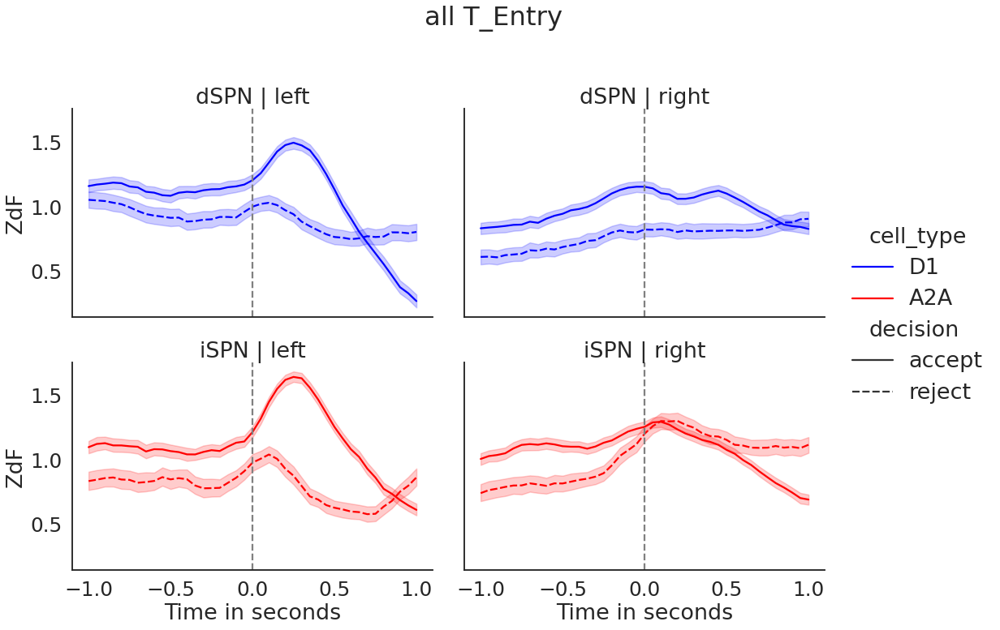

In [ ]:
# Throwing away quits
# collapse animal
plot_tag = "noquit_average"

plot_nb_df = nb_df_lagged[nb_df_lagged['quit'].isnull() &
                          nb_df_lagged['animal'].isin(['RRM030', 'RRM031', 'RRM032', 'RRM033'])].reset_index(drop=True)
plot_nb_df['roi'] = plot_nb_df['roi'].str.replace("_470nm", "")
plot_nb_df['neuron_type'] = plot_nb_df['cell_type'].map({'D1': 'dSPN', 'A2A': 'iSPN'})
# neural response plotting
x, y = f'{event}_neur_time', f'{event}_neur_ZdFF'
row, col, hue, style =  'neuron_type', 'roi', 'cell_type', 'decision'
other_cols = []
params = [x, y, row, col, hue, style]
kwargs = {'col_order': ['left', 'right'],
          'style_order': ['accept', 'reject'],
          'hue_order': ['D1', 'A2A'],
          'palette': ['b', 'r'],
          'aspect': 1.5}

sub_cols = [p for p in params if (p is not None)] + other_cols
# processing plotting data
plot_nb_df = rse.meta_safe_drop(plot_nb_df[sub_cols]).reset_index(drop=True)
# for col in col_orders:
#     plot_nb_df = nb_df_reorder_column(plot_nb_df, col, col_orders[col])
sns.set_context('talk', font_scale=1.5)
sns.set_style('white')
# g1= sns.relplot(x=f'{event}_neur_time', y=f'{event}_neur_ZdFF', col='hemi', row='switch{t+1}', style='movement', kind="line", color='b', data=plot_nb_df, palette='Spectral')
g1= sns.relplot(x=x, y=y, hue=hue, row=row, col=col, style=style, kind="line", data=plot_nb_df, **kwargs)
g1.map_dataframe(lambda data, **kwargs: plt.gca().axvline(0, c='gray', ls='--'))
#g1.map_dataframe(trial_av_vline_timedots, event=event, sort_order=['center_in{t+1}', 'outcome'], ylim0=plt.gca().get_ylim(), nbmat=pse.nbm)
g1.set_titles(col_template="{col_name}", row_template="{row_name}")
if gradient:
    g1.set_axis_labels("Time in seconds", "(ZdF)'")
else:
    g1.set_axis_labels("Time in seconds", y.split('_')[-1][:-1])
g1.fig.suptitle(f'{animal_arg} {event}', y=1.1)


# for ax in g1.axes.ravel():
#     ax.set_ylim(-0.5, 1.5)

In [ ]:
animal_arg = 'all'
plot_tag = 'RR DMS clean accept'
event = 'T_Entry'
gradient = False
# lagging data
# nb_df = pse.nbm.get_switch_number(nb_df)

nb_df_lagged = nb_df[nb_df['animal'].isin(['RRM030', 'RRM031', 'RRM032', 'RRM033'])].reset_index(drop=True)
rse.nbm.nb_cols, rse.nbm.nb_lag_cols = rse.nbm.parse_nb_cols(nb_df_lagged)
if gradient:
    targ_cols = rse.nbm.nb_cols[event+'_neur']
    nb_df_lagged[targ_cols] = np.gradient(nb_df[targ_cols].values, axis=1)

laglist = {'exit': {'pre': 1}, 'tone_onset': {'post': 1}, 'T_Entry': {'post': 1}}


# laglist.update({ev: {'pre': 1, 'post': 1} for ev in rse.nbm.behavior_events})
if animal_arg == 'all':
    nb_df_lagged = rse.nbm.lag_wide_df(nb_df_lagged, laglist).reset_index(drop=True)
else:
    nb_df_lagged = rse.nbm.lag_wide_df(df_select_kwargs(nb_df_lagged, animal=animal_arg).reset_index(drop=True), laglist)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:112: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


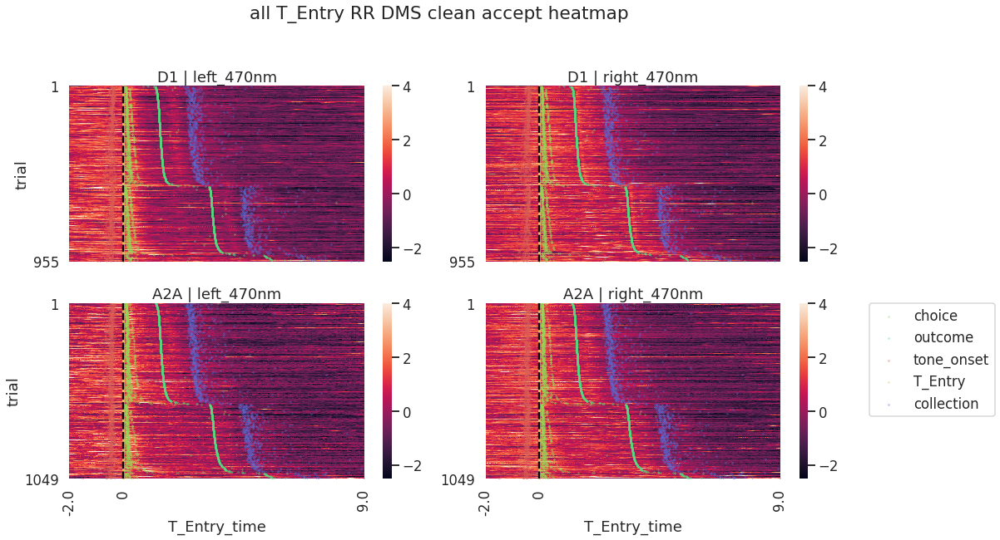

In [ ]:
# adding relevant behavioral/neural data
plot_nb_df = nb_df_lagged[nb_df_lagged['quit'].isnull() & (nb_df_lagged['accept'] == 1)].reset_index(drop=True)

row, col =  'cell_type', 'roi'
extra_events = ['choice', 'outcome', 'tone_onset', 'T_Entry', 'collection']
peri_event_map = {event: extra_events}
sort_cols = ['outcome', 'choice']
other_cols = ['animal', 'session', 'trial'] + extra_events + rse.nbm.nb_cols[f'{event}_neur']
params = [row, col]
kwargs = {'row_order': ['D1', 'A2A'],
          'col_order': ['left_470nm', 'right_470nm'],
          'height': 4,
          'aspect': 1.8}

sub_cols = [p for p in params if (p is not None)] + other_cols
# processing plotting datandle
plot_nb_df = rse.meta_safe_drop(plot_nb_df[sub_cols]).reset_index(drop=True)

sns.set_context('talk')
sns.set_style('white')

g1 = sns.FacetGrid(plot_nb_df,row=row, col=col, sharey=False, **kwargs)
# ymaxes = np.zeros(g1.axes.shape)
g1.map_dataframe(df_wide_heatmap, event=event, nbmat=rse.nbm, sort_cols=sort_cols,
                 peri_event_map=peri_event_map ,cbar=True, cmap='rocket', vmin=-2.5, vmax=5)
g1.set_titles(col_template="{col_name}", row_template="{row_name}")
g1.set_axis_labels(f'{event}_time', 'trial')
g1.fig.suptitle(f'{animal_arg} {event} {plot_tag} heatmap', y=1.1)
g1.axes.ravel()[-1].legend(bbox_to_anchor=(1.3, 1), loc='upper left', borderaxespad=0)

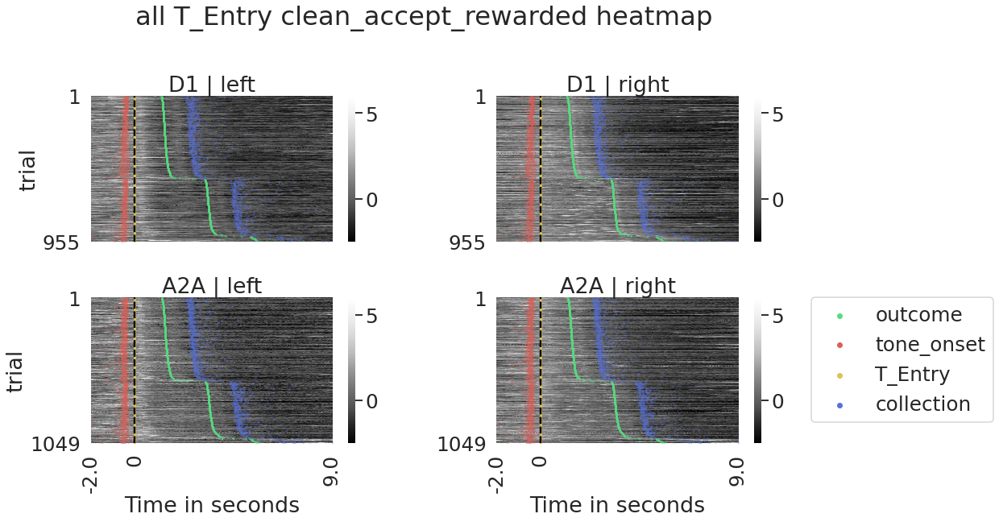

In [ ]:
plot_tag = 'clean_accept_rewarded'
# adding relevant behavioral/neural data
plot_nb_df = nb_df_lagged[nb_df_lagged['quit'].isnull() & (nb_df_lagged['accept'] == 1)].reset_index(drop=True)
plot_nb_df['roi'] = plot_nb_df['roi'].str.replace("_470nm", "")

row, col =  'cell_type', 'roi'
extra_events = ['outcome', 'tone_onset', 'T_Entry', 'collection']# collection filters out all the rewarded trials
peri_event_map = {event: extra_events}
sort_cols = ['reward', 'outcome']
other_cols = ['animal', 'session', 'trial', 'reward'] + extra_events + rse.nbm.nb_cols[f'{event}_neur']
params = [row, col]
kwargs = {'row_order': ['D1', 'A2A'],
          'col_order': ['left', 'right'],
          'height': 4,
          'aspect': 1.8}

sub_cols = [p for p in params if (p is not None)] + other_cols
# processing plotting datandle
plot_nb_df = rse.meta_safe_drop(plot_nb_df[sub_cols]).reset_index(drop=True)

sns.set_context('talk', font_scale=1.5)
sns.set_style('white')

g1 = sns.FacetGrid(plot_nb_df,row=row, col=col, sharey=False, **kwargs)
# ymaxes = np.zeros(g1.axes.shape)
g1.map_dataframe(df_wide_heatmap, event=event, nbmat=rse.nbm, sort_cols=sort_cols,
                 peri_event_map=peri_event_map ,cbar=True, cmap='Greys_r', vmin=-2.5, vmax=6)
g1.set_titles(col_template="{col_name}", row_template="{row_name}")
g1.set_axis_labels(f'Time in seconds', 'trial')
g1.fig.suptitle(f'{animal_arg} {event} {plot_tag} heatmap', y=1.1)
lgnd = g1.axes.ravel()[-1].legend(bbox_to_anchor=(1.3, 1), loc='upper left', borderaxespad=0)
for handle in lgnd.legendHandles:
    handle.set_sizes([30])

g1.savefig(os.path.join(rse.plot_path, f'{plot_tag}_{animal_arg}_{event}_heatmap.png'))

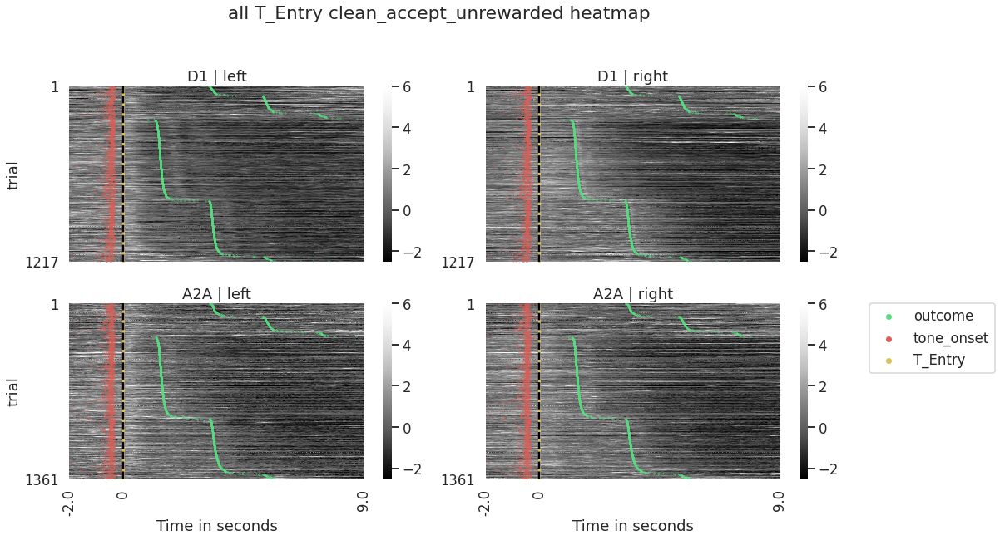

In [ ]:
plot_tag = 'clean_accept_unrewarded'
# adding relevant behavioral/neural data
plot_nb_df = nb_df_lagged[nb_df_lagged['quit'].isnull() & (nb_df_lagged['accept'] == 1)].reset_index(drop=True)
plot_nb_df['roi'] = plot_nb_df['roi'].str.replace("_470nm", "")

row, col =  'cell_type', 'roi'
extra_events = ['outcome', 'tone_onset', 'T_Entry']# collection filters out all the rewarded trials
peri_event_map = {event: extra_events}
sort_cols = ['reward', 'outcome']
other_cols = ['animal', 'session', 'trial', 'reward'] + extra_events + rse.nbm.nb_cols[f'{event}_neur']
params = [row, col]
kwargs = {'row_order': ['D1', 'A2A'],
          'col_order': ['left', 'right'],
          'height': 4,
          'aspect': 1.8}

sub_cols = [p for p in params if (p is not None)] + other_cols
# processing plotting datandle
plot_nb_df = rse.meta_safe_drop(plot_nb_df[sub_cols]).reset_index(drop=True)

sns.set_context('talk')
sns.set_style('white')

g1 = sns.FacetGrid(plot_nb_df,row=row, col=col, sharey=False, **kwargs)
# ymaxes = np.zeros(g1.axes.shape)
g1.map_dataframe(df_wide_heatmap, event=event, nbmat=rse.nbm, sort_cols=sort_cols,
                 peri_event_map=peri_event_map ,cbar=True, cmap='Greys_r', vmin=-2.5, vmax=6)
g1.set_titles(col_template="{col_name}", row_template="{row_name}")
g1.set_axis_labels(f'Time in seconds', 'trial')
g1.fig.suptitle(f'{animal_arg} {event} {plot_tag} heatmap', y=1.1)
lgnd = g1.axes.ravel()[-1].legend(bbox_to_anchor=(1.3, 1), loc='upper left', borderaxespad=0)
for handle in lgnd.legendHandles:
    handle.set_sizes([30])

g1.savefig(os.path.join(rse.plot_path, f'{plot_tag}_{animal_arg}_{event}_heatmap.png'))